In [3]:
from google.colab import drive
drive.mount('/content/drive')

import os

data_dir = "/content/drive/My Drive/traffic_project/yolo_dataset/images/train"

# Listing few files to verify structure
for root, dirs, files in os.walk(data_dir):
    print("Current directory:", root)
    print("Subfolders:", dirs)
    print("Files:", files[:5])
    break

Mounted at /content/drive
Current directory: /content/drive/My Drive/traffic_project/yolo_dataset/images/train
Subfolders: []
Files: ['14874094-12660fcc.jpg', '15905cba-a05acd4a.jpg', '19590021-2f16ff86.jpg', '15696e58-e4037c8b.jpg', '1812c350-6159bc75.jpg']


Image: 14874094-12660fcc.jpg | Shape: (768, 1280, 3) | Mean Brightness: 77.76


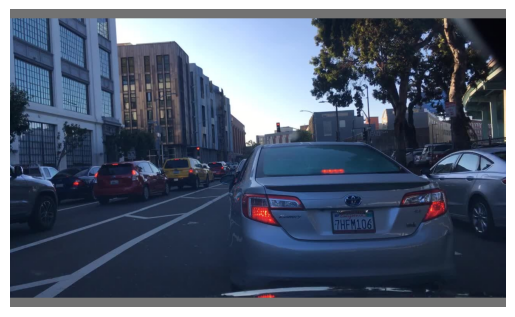

Image: 15905cba-a05acd4a.jpg | Shape: (768, 1280, 3) | Mean Brightness: 110.22


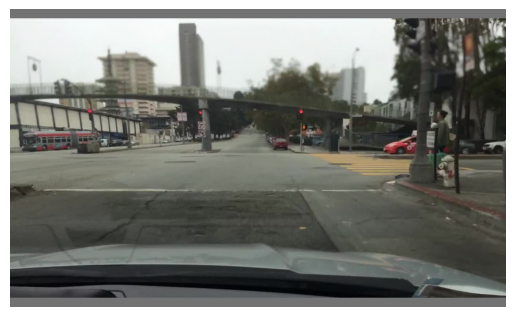

Image: 19590021-2f16ff86.jpg | Shape: (768, 1280, 3) | Mean Brightness: 96.52


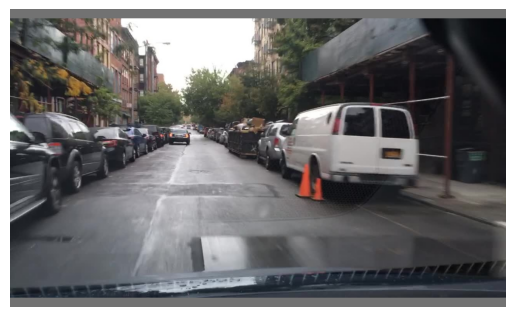

Image: 15696e58-e4037c8b.jpg | Shape: (768, 1280, 3) | Mean Brightness: 105.22


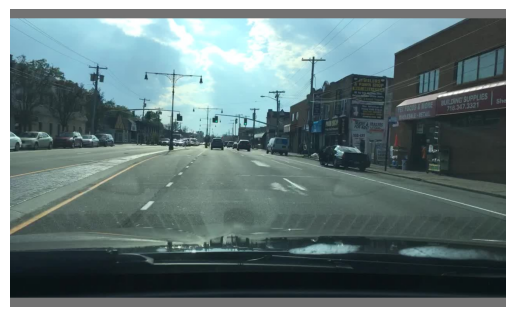

Image: 1812c350-6159bc75.jpg | Shape: (768, 1280, 3) | Mean Brightness: 103.71


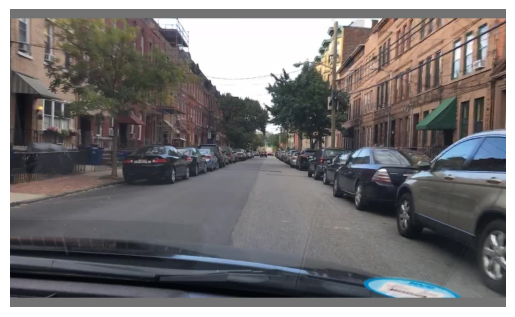

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

image_files = glob.glob(os.path.join(data_dir, "*.jpg"))[:5]

if not image_files:
    print(f"No image files found in {data_dir}")
else:
    for img_path in image_files:
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        print(f"Image: {os.path.basename(img_path)} | Shape: {img.shape} | Mean Brightness: {np.mean(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)):.2f}")

        plt.imshow(img_rgb)
        plt.axis("off")
        plt.show()

In [2]:
import os, json
from tqdm import tqdm

base_dir = "/content/drive/MyDrive/traffic_project/yolo_dataset/images/train"

bad_jsons = []
for f in tqdm(os.listdir(base_dir)):
    if f.lower().endswith((".jpg", ".jpeg", ".png")):
        json_path = os.path.splitext(os.path.join(base_dir, f))[0] + ".json"
        if not os.path.exists(json_path):
            bad_jsons.append(f)
        else:
            try:
                with open(json_path, "r", encoding="utf-8") as jf:
                    json.load(jf)
            except Exception:
                bad_jsons.append(f)

print(f" Missing or invalid JSONs: {len(bad_jsons)}")
print(bad_jsons[:10])

100%|██████████| 7019/7019 [00:00<00:00, 8210.41it/s]

 Missing or invalid JSONs: 7019
['14874094-12660fcc.jpg', '15905cba-a05acd4a.jpg', '19590021-2f16ff86.jpg', '15696e58-e4037c8b.jpg', '1812c350-6159bc75.jpg', '13dcc2ca-b289b76f.jpg', '11dc1774-3e573074.jpg', '14a34b0d-36f4de12.jpg', '16b0973f-f6e8d13e.jpg', '1898c22d-bafa62f5.jpg']


In [3]:
import cv2
import numpy as np

invalid_boxes = []

for f in tqdm(os.listdir(base_dir)):
    if not f.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(base_dir, f)
    json_path = os.path.splitext(img_path)[0] + ".json"
    if not os.path.exists(json_path):
        continue

    img = cv2.imread(img_path)
    if img is None:
        continue
    h, w = img.shape[:2]

    with open(json_path, "r", encoding="utf-8") as jf:
        anns = json.load(jf)

    for ann in anns:
        if "bbox" not in ann:
            continue
        x, y, bw, bh = ann["bbox"]
        # Check invalid size or out-of-bound coordinates
        if bw <= 1 or bh <= 1 or x < 0 or y < 0 or x + bw > w or y + bh > h:
            invalid_boxes.append((f, ann["bbox"]))

print(f"Invalid boxes found: {len(invalid_boxes)}")
print(invalid_boxes[:5])


100%|██████████| 7019/7019 [00:01<00:00, 6706.64it/s]

Invalid boxes found: 0
[]


In [4]:
from collections import Counter

label_counts = Counter()

for f in tqdm(os.listdir(base_dir)):
    if not f.endswith(".json"):
        continue
    try:
        anns = json.load(open(os.path.join(base_dir, f), "r", encoding="utf-8"))
        for ann in anns:
            if "category" in ann:
                label_counts[ann["category"]] += 1
    except:
        continue

print(" All Labels:", label_counts)

100%|██████████| 7019/7019 [00:00<00:00, 1566114.47it/s]

 All Labels: Counter()


In [5]:
img_files = {os.path.splitext(f)[0] for f in os.listdir(base_dir) if f.endswith((".jpg", ".jpeg", ".png"))}
json_files = {os.path.splitext(f)[0] for f in os.listdir(base_dir) if f.endswith(".json")}

missing_json = img_files - json_files
missing_img = json_files - img_files

print(f" Missing JSONs: {len(missing_json)}")
print(f" Missing Images: {len(missing_img)}")

 Missing JSONs: 7019
 Missing Images: 0


In [7]:
import os
import json
from PIL import Image
from tqdm import tqdm
import shutil

In [9]:
# --- PATHS ---
base_dir = "/content/drive/MyDrive/traffic_project/matched_val"
yolo_dir = "/content/drive/MyDrive/traffic_project/yoloval_dataset"

images_out = os.path.join(yolo_dir, "images", "val")
labels_out = os.path.join(yolo_dir, "labels", "val")

os.makedirs(images_out, exist_ok=True)
os.makedirs(labels_out, exist_ok=True)

# --- CLASSES ---
classes = ['person', 'rider', 'car', 'bus', 'truck', 'bike', 'motor', 'traffic light', 'traffic sign', 'train']

def convert_bbox(size, box):
    img_w, img_h = size
    x_min, y_min, w, h = box
    x_center = x_min + w / 2
    y_center = y_min + h / 2
    return (x_center / img_w, y_center / img_h, w / img_w, h / img_h)

# --- CONVERT ---
files = [f for f in os.listdir(base_dir) if f.endswith('.json')]

for file in tqdm(files, desc="Converting val JSON to YOLO"):
    json_path = os.path.join(base_dir, file)
    image_name = file.replace('.json', '.jpg')
    image_path = os.path.join(base_dir, image_name)
    label_path = os.path.join(labels_out, file.replace('.json', '.txt'))

    if not os.path.exists(image_path):
        continue

    shutil.copy(image_path, os.path.join(images_out, image_name))

    with Image.open(image_path) as img:
        img_w, img_h = img.size

    with open(json_path, 'r') as f:
        annotations = json.load(f)

    with open(label_path, 'w') as out:
        for obj in annotations:
            cls_name = obj["category"]
            if cls_name not in classes:
                continue
            cls_id = classes.index(cls_name)
            bbox = obj["bbox"]
            x_center, y_center, w, h = convert_bbox((img_w, img_h), bbox)
            out.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

print(" Validation conversion complete!")

Converting val JSON to YOLO: 100%|██████████| 7019/7019 [00:00<00:00, 15164.50it/s]

 Validation conversion complete!


### map category id

In [ ]:
# Rebuild YOLO .txt labels from original JSONs (safe, with backup)
import os, json, shutil, time
from PIL import Image
from collections import Counter

# ---------- USER PATHS (already provided) ----------
ORIGINAL_JSON_DIR = "/content/drive/MyDrive/traffic_project/matched_train"
LABEL_DIRS = {
    "train": "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/train",
    "val":   "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/val",
    "test":  "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/test"
}
IMAGE_DIRS = {
    "train": "/content/drive/MyDrive/traffic_project/yolo_dataset/images/train",
    "val":   "/content/drive/MyDrive/traffic_project/yolo_dataset/images/val",
    "test":  "/content/drive/MyDrive/traffic_project/yolo_dataset/images/test"
}

# ---------- CONFIRMED MAPPING: original category_id -> YOLO id ----------
category_to_yolo = {
    0: 0,   # pedestrian
    2: 1,   # rider
    3: 2,   # car
    4: 3,   # truck
    5: 4,   # bus
    6: 5,   # train
    7: 6,   # motorcycle
    8: 7,   # bicycle
    9: 8,   # traffic light
    10: 9   # traffic sign
}

# ---------- Helper to find image path for base name ----------
def find_image_path(base):
    for split, img_root in IMAGE_DIRS.items():
        for ext in (".jpg", ".jpeg", ".png"):
            p = os.path.join(img_root, base + ext)
            if os.path.exists(p):
                return p, split
    return None, None

# ---------- Function to rebuild a single label file from JSON ----------
def rebuild_label_from_json(base, out_txt_path):
    json_path = os.path.join(ORIGINAL_JSON_DIR, base + ".json")
    if not os.path.exists(json_path):
        return False, f"JSON not found: {json_path}"
    # find corresponding image to get width/height
    img_path, split = find_image_path(base)
    if img_path is None:
        return False, f"Image not found for base {base} (checked images folders)"
    # read image size
    with Image.open(img_path) as im:
        W, H = im.size
    # parse JSON
    with open(json_path, "r") as jf:
        try:
            objs = json.load(jf)  # BDD100K per-image: list of dicts
        except Exception as e:
            return False, f"Error reading JSON {json_path}: {e}"
    lines = []
    for obj in objs:
        cid = obj.get("category_id")
        if cid is None:
            continue
        if cid not in category_to_yolo:
            # skip categories not in your final mapping
            continue
        new_id = category_to_yolo[cid]
        x_min, y_min, box_w, box_h = obj["bbox"]
        # convert to YOLO normalized cx,cy,w,h
        cx = (x_min + box_w / 2.0) / W
        cy = (y_min + box_h / 2.0) / H
        nw = box_w / W
        nh = box_h / H
        # clamp values (safe)
        cx = max(0.0, min(1.0, cx))
        cy = max(0.0, min(1.0, cy))
        nw = max(0.0, min(1.0, nw))
        nh = max(0.0, min(1.0, nh))
        lines.append(f"{new_id} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}\n")
    # write file (overwrite)
    with open(out_txt_path, "w") as out:
        out.writelines(lines)
    return True, f"Rebuilt {out_txt_path} (objects: {len(lines)})"

# ---------- Rebuild loop over splits ----------
summary = {}
for split, lbl_dir in LABEL_DIRS.items():
    summary[split] = {"processed":0, "skipped_no_json":0, "skipped_no_image":0, "rebuilt":0}
    if not os.path.exists(lbl_dir):
        print(f"Label folder does not exist (skipping): {lbl_dir}")
        continue
    for fname in os.listdir(lbl_dir):
        if not fname.endswith(".txt"):
            continue
        base = os.path.splitext(fname)[0]
        out_txt = os.path.join(lbl_dir, fname)
        summary[split]["processed"] += 1
        json_path = os.path.join(ORIGINAL_JSON_DIR, base + ".json")
        if not os.path.exists(json_path):
            summary[split]["skipped_no_json"] += 1
            continue
        img_path, found_split = find_image_path(base)
        if img_path is None:
            summary[split]["skipped_no_image"] += 1
            continue
        ok, msg = rebuild_label_from_json(base, out_txt)
        if ok:
            summary[split]["rebuilt"] += 1
        else:
            summary[split].setdefault("errors", []).append(msg)

# ---------- Print summary ----------
print("\n=== Rebuild Summary ===")
for s, stats in summary.items():
    print(f"{s}: processed={stats['processed']}, rebuilt={stats['rebuilt']}, skipped_no_json={stats['skipped_no_json']}, skipped_no_image={stats['skipped_no_image']}")
    if "errors" in stats:
        print("  Errors (example):", stats["errors"][:3])
#print("\nBackup is at:", backup_root)
print("All done. Now you can run a quick validation (model.val()) or inspect sample files.")


In [ ]:
import os
import random
import shutil
from glob import glob

# Paths
dataset_dir = '/content/drive/MyDrive/traffic_project/yolo_dataset/'
image_dir = os.path.join(dataset_dir, 'images')
label_dir = os.path.join(dataset_dir, 'labels')

# Collect all images
images = glob(os.path.join(image_dir, 'train', '*.jpg')) + \
         glob(os.path.join(image_dir, 'train', '*.png'))

random.shuffle(images)

# Split sizes
total = len(images)
train_size = int(0.8 * total)
val_size = int(0.1 * total)
test_size = total - train_size - val_size

train_files = images[:train_size]
val_files = images[train_size:train_size + val_size]
test_files = images[train_size + val_size:]

# Ensure directories exist
splits = ['train', 'val', 'test']
for split in splits:
    os.makedirs(os.path.join(image_dir, split), exist_ok=True)
    os.makedirs(os.path.join(label_dir, split), exist_ok=True)

# Move images + matching labels
def move_pairs(file_list, split):
    for img_path in file_list:
        file_name = os.path.basename(img_path)
        label_name = file_name.replace('.jpg', '.txt').replace('.png', '.txt')

        # Paths
        new_img_path = os.path.join(image_dir, split, file_name)
        old_label_path = os.path.join(label_dir, 'train', label_name)
        new_label_path = os.path.join(label_dir, split, label_name)

        # Move image
        shutil.move(img_path, new_img_path)

        # Move label only if exists
        if os.path.exists(old_label_path):
            shutil.move(old_label_path, new_label_path)
        else:
            print(f" Missing label for: {file_name}")

# Execute split
move_pairs(train_files, 'train')
move_pairs(val_files, 'val')
move_pairs(test_files, 'test')

print(f"Split complete!")
print(f"Train: {len(train_files)}, Val: {len(val_files)}, Test: {len(test_files)}")


### Install and import ultralytics

In [1]:
!pip install ultralytics --upgrade -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 44.8 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Train YOLO8 model

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # load pretrained model

model.train(
    data='/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml',
    epochs=40,
    imgsz=640,
    batch=16,
    name='train_yolov8',
    project='/content/drive/MyDrive/traffic_project/runs',
    device=0,
    patience=10  # stops early if no improvement
)

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_yolov82, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7909cea79970>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

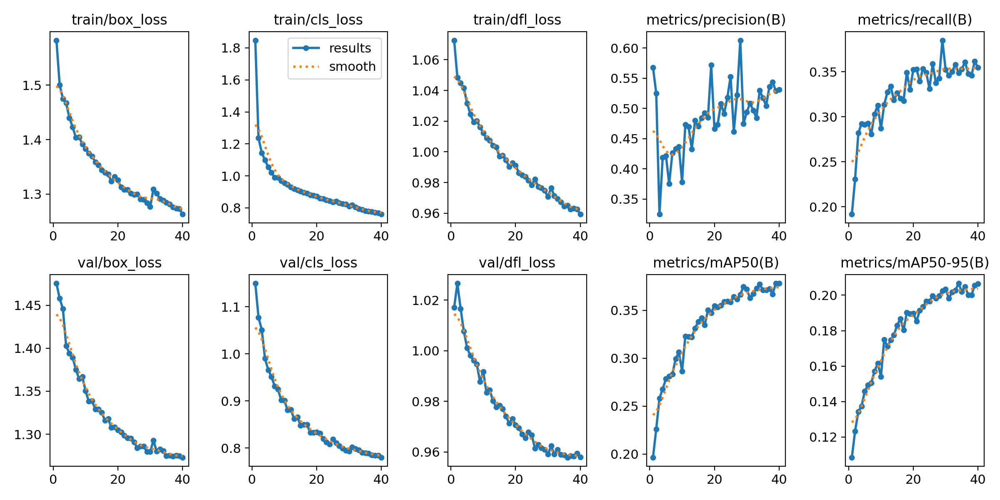

In [ ]:
from IPython.display import Image, display
display(Image('/content/drive/MyDrive/traffic_project/runs/train_yolov8/results.png'))

In [ ]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 97.9±36.8 MB/s, size: 208.7 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 4.9it/s 11.1s
                   all        877      15616      0.527      0.349      0.378      0.208
            pedestrian        282       1129      0.615      0.451      0.482       0.23
                 rider         47         60      0.687      0.283      0.342      0.179
                   car        862       8714      0.683      0.674      0.713      0.449
                 truck        215        301      0.479      0.387      0.356      0.253
                  

In [ ]:
results = model.predict(
    source='/content/drive/MyDrive/traffic_project/yolo_dataset/images/test',
    conf=0.25,
    save=True,
    project='/content/drive/MyDrive/traffic_project/runs',
    name='predict_yolov8'
)


image 1/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0001542f-7c670be8.jpg: 384x640 1 pedestrian, 2 cars, 1 traffic sign, 42.2ms
image 2/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0004974f-05e1c285.jpg: 384x640 3 cars, 6.0ms
image 3/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00202076-7a95b4e3.jpg: 384x640 7 cars, 6.4ms
image 4/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0024b742-acbed4fb.jpg: 384x640 5 cars, 3 traffic signs, 6.1ms
image 5/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002827ad-8748e2fb.jpg: 384x640 2 cars, 6.2ms
image 6/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002d290d-89f4e5c0.jpg: 384x640 5 cars, 2 traffic signs, 6.5ms
image 7/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00391a82-d1428e56.jpg: 384x640 2 cars, 1 traffic light, 2 traffic signs, 6.0ms
image 8/878 /content/drive/MyDrive/traffic_project/yo

In [ ]:
for r in results:
    r.save()

### YOLO 10 model

In [ ]:
model10 = YOLO("yolov10s.pt")
model10.train(data='/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml', epochs=40, imgsz=640, batch=16, name='train_yolov10',
    project='/content/drive/MyDrive/traffic_project/runs10',
    device=0, )

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_yolov102, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

In [14]:
model = YOLO("/content/drive/MyDrive/traffic_project/runs10/train_yolov102/weights/best.pt")
results_yolo10= model.predict(
    source="/content/drive/MyDrive/traffic_project/yolo_dataset/images/test",
    save=True,
    save_txt=True,
    project="/content/drive/MyDrive/traffic_project/runs10/detect",
    name="yolov10_predictions"
)


image 1/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0001542f-7c670be8.jpg: 384x640 1 pedestrian, 2 cars, 1 traffic light, 1 traffic sign, 72.6ms
image 2/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0004974f-05e1c285.jpg: 384x640 3 cars, 9.7ms
image 3/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00202076-7a95b4e3.jpg: 384x640 5 cars, 10.2ms
image 4/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0024b742-acbed4fb.jpg: 384x640 5 cars, 4 traffic signs, 9.5ms
image 5/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002827ad-8748e2fb.jpg: 384x640 5 cars, 9.5ms
image 6/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002d290d-89f4e5c0.jpg: 384x640 4 cars, 3 traffic signs, 9.7ms
image 7/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00391a82-d1428e56.jpg: 384x640 2 cars, 3 traffic signs, 9.7ms
image 8/878 /content/drive/MyDrive/traffic_project/y

In [15]:
metrics = model.val(data='/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml', split="val")
print(metrics)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 0.4±0.1 MB/s, size: 285.0 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 1.1it/s 50.1s
                   all        877      15616      0.678      0.412      0.467      0.265
            pedestrian        282       1129      0.691      0.504      0.567      0.277
                 rider         47         60      0.697      0.346      0.435      0.216
                   car        862       8714       0.73      0.704       0.76      0.485
                 truck        215        301      0.495      0.452      0.395      0.289
                   bus        119        152      0.616      0.421      0.469      0.36

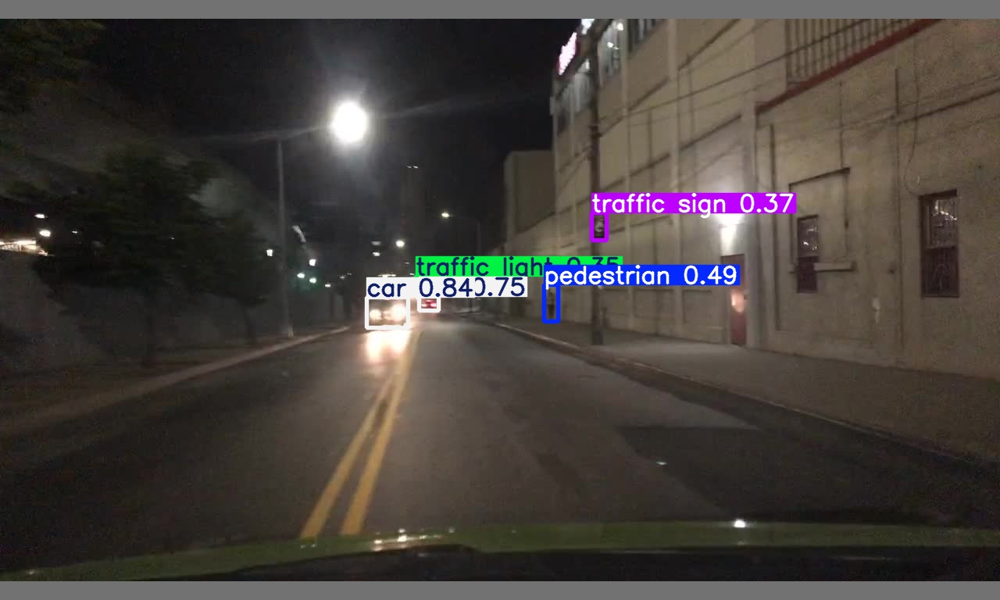

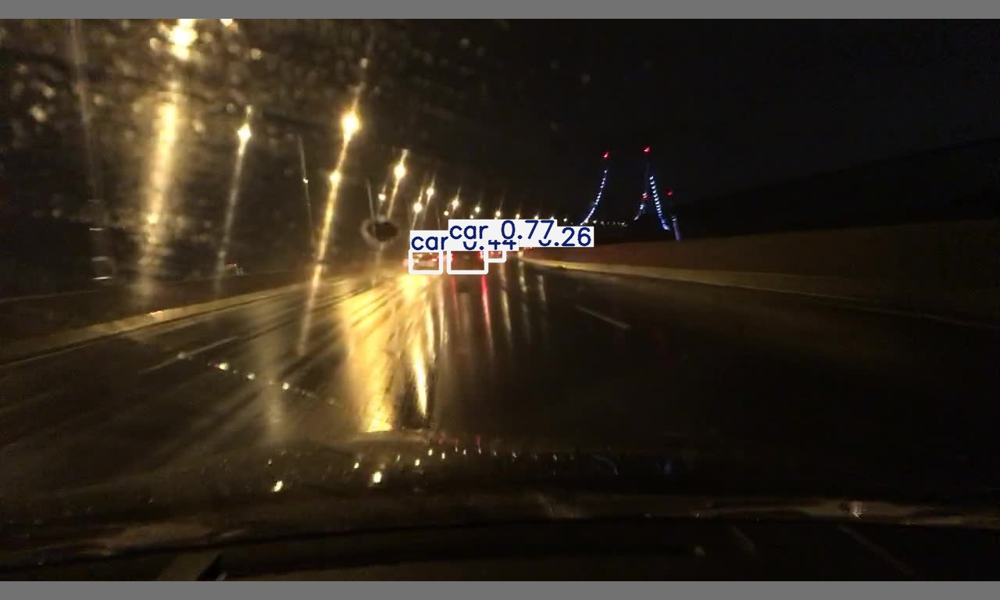

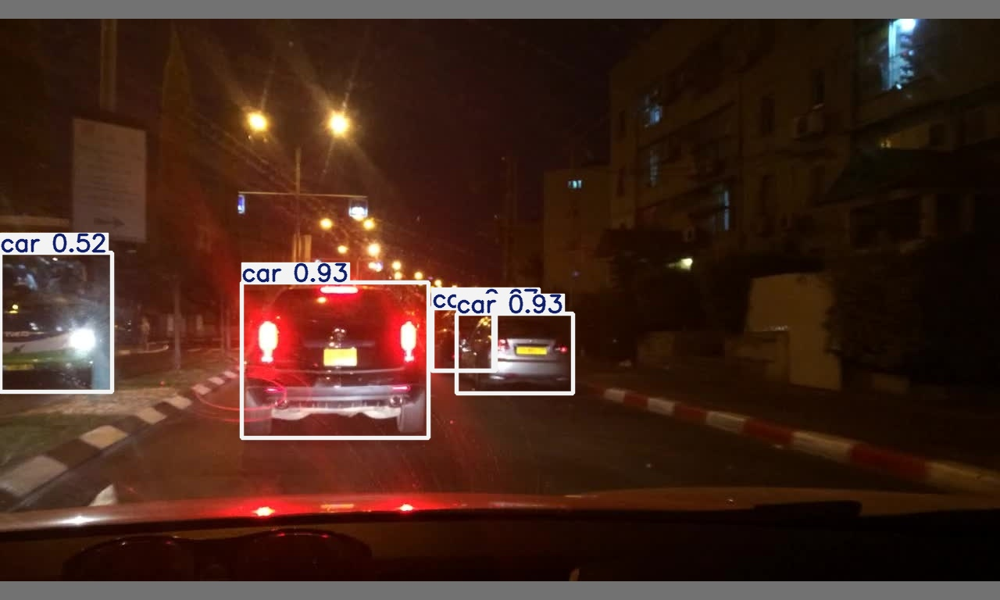

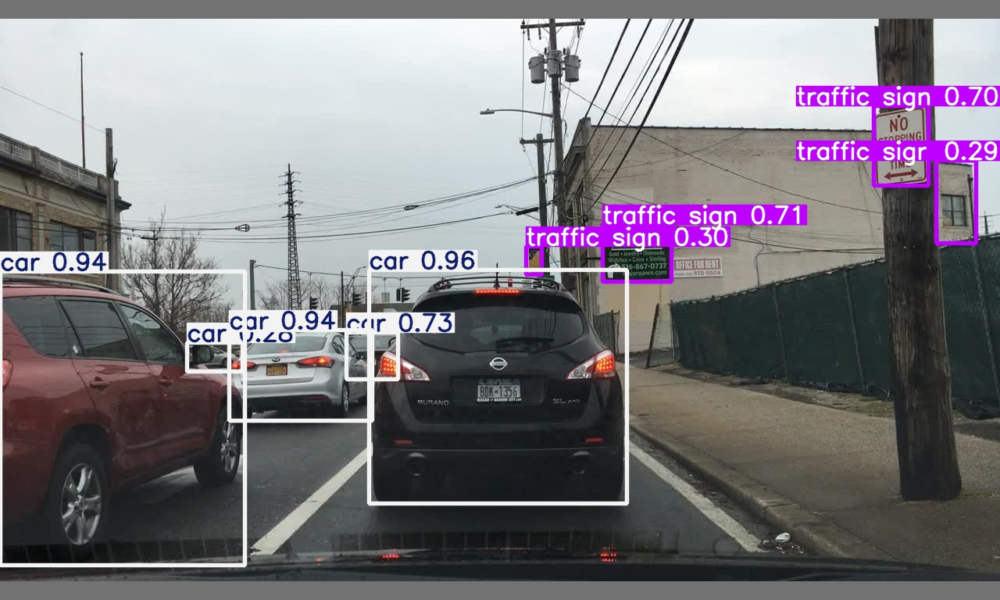

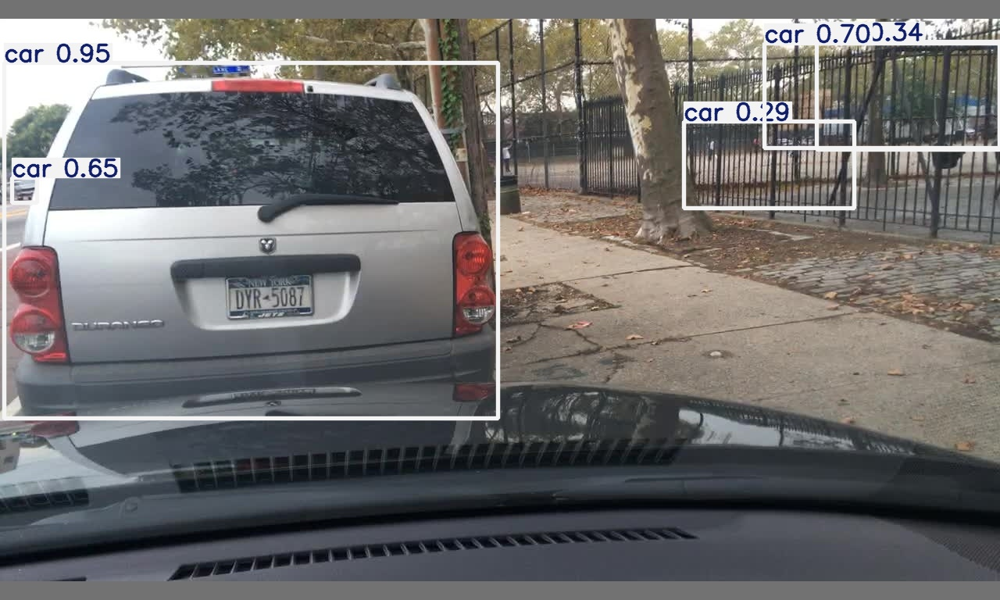

In [16]:
import glob
import cv2
from google.colab.patches import cv2_imshow

pred_imgs = glob.glob("/content/drive/MyDrive/traffic_project/runs10/detect/yolov10_predictions3/*.jpg")[:5]
for img in pred_imgs:
    img_bgr = cv2.imread(img)
    cv2_imshow(img_bgr)

### YOLO11 model

In [ ]:
from ultralytics import YOLO

model11 = YOLO("yolo11s.pt")  # small model variant, modify if needed
model11.train(
    data="/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml",
    epochs=40,
    imgsz=640,
    batch=16,
    project="/content/drive/MyDrive/traffic_project/runs11",
    name="train_yolo11",
    device=0,
    patience=10
)

In [17]:
model11 = YOLO("/content/drive/MyDrive/traffic_project/runs11/train_yolo112/weights/best.pt")

# Evaluation (computes mAP, Precision, Recall)
metrics = model11.val(data="/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml")
print(metrics)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
YOLO11s summary (fused): 100 layers, 9,416,670 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 102.2±39.2 MB/s, size: 177.5 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 5.4it/s 10.2s
                   all        877      15616      0.621      0.433      0.438      0.248
            pedestrian        282       1129      0.615       0.55      0.577      0.293
                 rider         47         60      0.538      0.447      0.449      0.228
                   car        862       8714      0.707      0.718      0.759      0.491
                 truck        215        301      0.495      0.445      0.407        0.3


In [18]:
# Predictions and saving to Drive
result11= model11.predict(
    source="/content/drive/MyDrive/traffic_project/yolo_dataset/images/test",
    save=True,
    save_txt=True,
    project="/content/drive/MyDrive/traffic_project/runs11",
    name="yolo11_predictions"
)


image 1/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0001542f-7c670be8.jpg: 384x640 1 pedestrian, 2 cars, 1 traffic sign, 41.7ms
image 2/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0004974f-05e1c285.jpg: 384x640 4 cars, 9.4ms
image 3/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00202076-7a95b4e3.jpg: 384x640 5 cars, 1 traffic sign, 9.4ms
image 4/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0024b742-acbed4fb.jpg: 384x640 5 cars, 1 traffic light, 2 traffic signs, 9.5ms
image 5/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002827ad-8748e2fb.jpg: 384x640 4 cars, 9.3ms
image 6/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002d290d-89f4e5c0.jpg: 384x640 5 cars, 3 traffic signs, 9.8ms
image 7/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00391a82-d1428e56.jpg: 384x640 2 cars, 3 traffic signs, 9.4ms
image 8/878 /content/drive/MyDrive/tr

In [19]:
metrics11 = model11.val(data='/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml', split="val")
print(metrics11)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 116.6±27.7 MB/s, size: 233.7 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 7.7it/s 7.1s
                   all        877      15616      0.621      0.433      0.438      0.248
            pedestrian        282       1129      0.615       0.55      0.577      0.293
                 rider         47         60      0.538      0.447      0.449      0.228
                   car        862       8714      0.707      0.718      0.759      0.491
                 truck        215        301      0.495      0.445      0.407        0.3
                   bus        119        152      0.511       0.48      0.469      0.

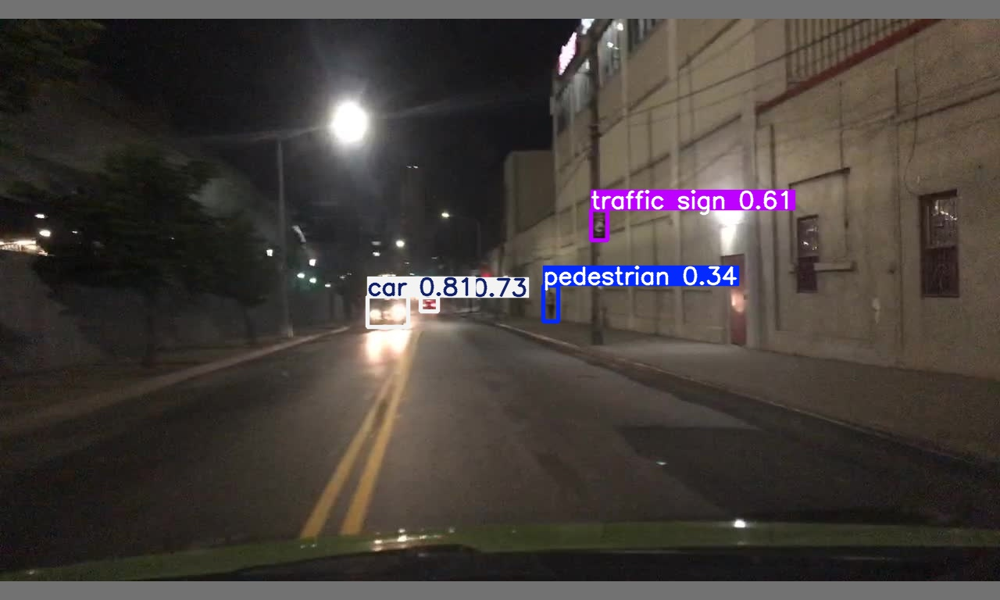

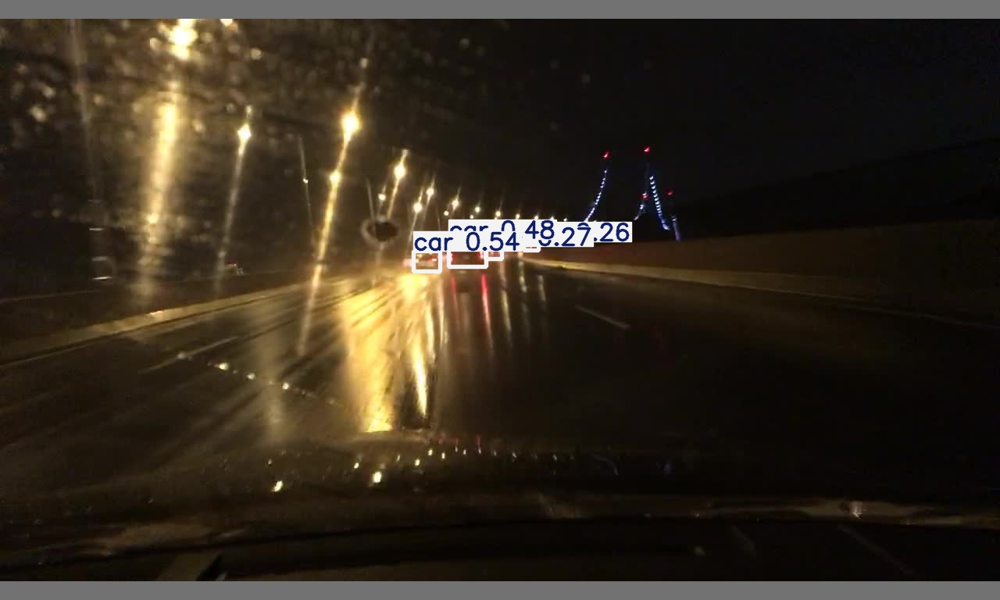

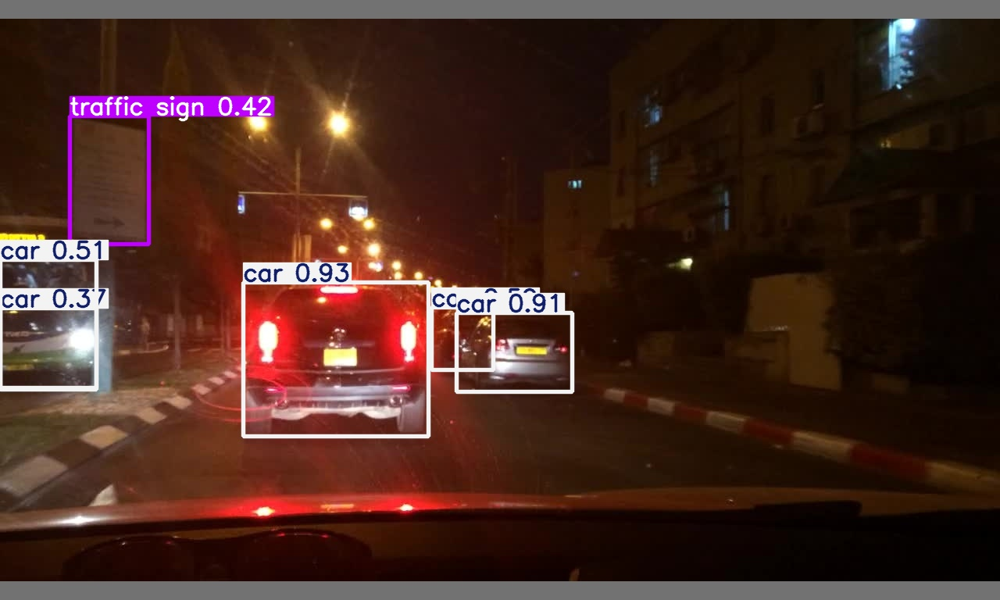

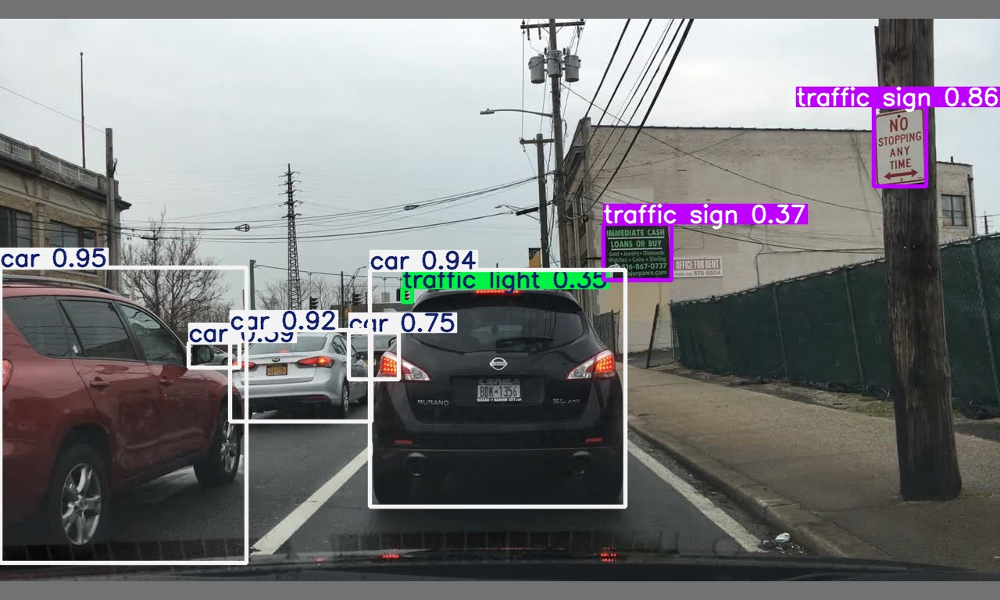

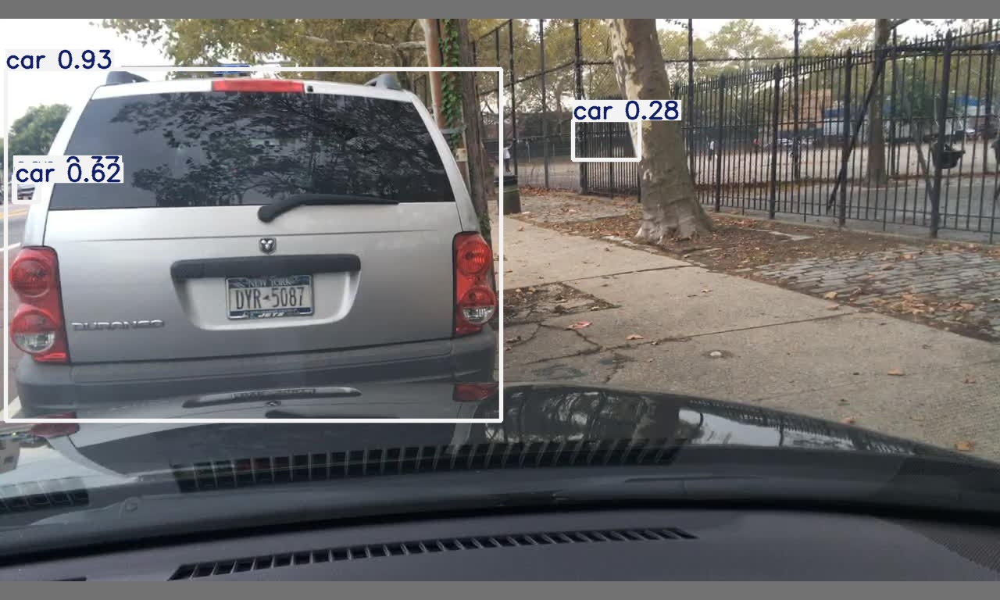

In [20]:
import glob
import cv2
from google.colab.patches import cv2_imshow

pred_imgs = glob.glob("/content/drive/MyDrive/traffic_project/runs11/yolo11_predictions/*.jpg")[:5]
for img in pred_imgs:
    img_bgr = cv2.imread(img)
    cv2_imshow(img_bgr)

### Yolo10 model with 150 epoch

In [ ]:
model10m = YOLO("yolov10m.pt")
model10m.train(data="/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml",
            epochs=120, imgsz=640, batch=12, project="/content/drive/MyDrive/traffic_project/runs10_long", name="yolov10_120ep", device=0)

In [21]:
model10m = YOLO("/content/drive/MyDrive/traffic_project/runs10_long/yolov10_120ep/weights/best.pt")

# Evaluation (computes mAP, Precision, Recall)
metrics = model10m.val(data="/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml")
print(metrics)

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
YOLOv10m summary (fused): 136 layers, 15,318,958 parameters, 0 gradients, 58.9 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 105.3±37.8 MB/s, size: 199.5 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 5.4it/s 10.3s
                   all        877      15616      0.725       0.46      0.498      0.281
            pedestrian        282       1129      0.751      0.547      0.628      0.318
                 rider         47         60      0.762      0.517       0.54      0.292
                   car        862       8714      0.788      0.721      0.789      0.512
                 truck        215        301      0.612      0.467       0.47      0.33

In [22]:
results_yolo10= model10m.predict(
    source="/content/drive/MyDrive/traffic_project/yolo_dataset/images/test",
    save=True,
    save_txt=True,
    project="/content/drive/MyDrive/traffic_project/runs10_long",
    name="yolov10_120ep"
)


image 1/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0001542f-7c670be8.jpg: 384x640 1 pedestrian, 2 cars, 1 traffic light, 1 traffic sign, 71.2ms
image 2/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0004974f-05e1c285.jpg: 384x640 4 cars, 1 traffic sign, 12.7ms
image 3/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00202076-7a95b4e3.jpg: 384x640 4 cars, 1 traffic sign, 12.3ms
image 4/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/0024b742-acbed4fb.jpg: 384x640 5 cars, 1 traffic light, 4 traffic signs, 11.6ms
image 5/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002827ad-8748e2fb.jpg: 384x640 3 cars, 11.4ms
image 6/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/002d290d-89f4e5c0.jpg: 384x640 4 cars, 4 traffic signs, 11.6ms
image 7/878 /content/drive/MyDrive/traffic_project/yolo_dataset/images/test/00391a82-d1428e56.jpg: 384x640 2 cars, 3 traffic signs, 11.4m

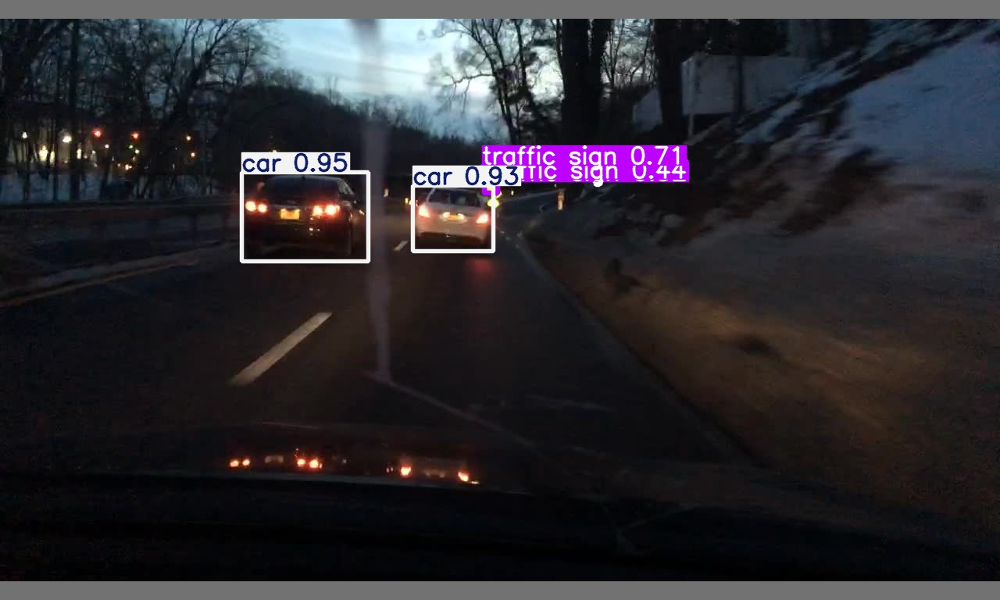

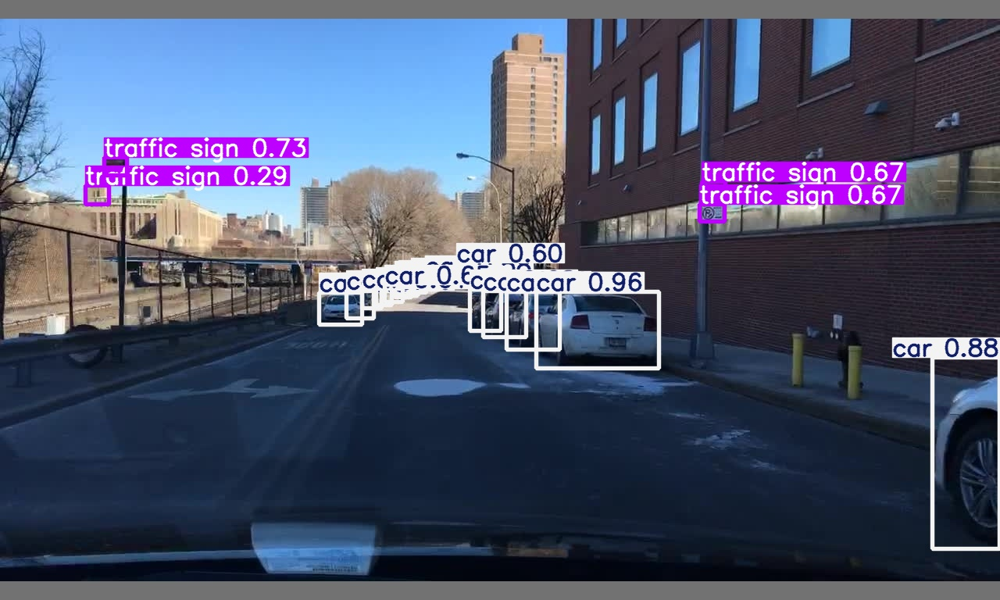

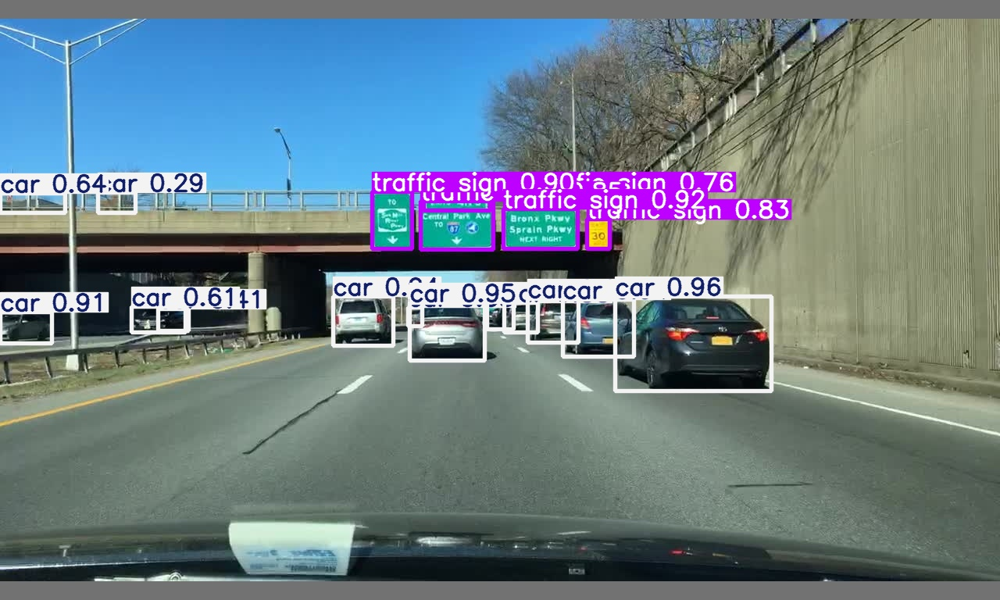

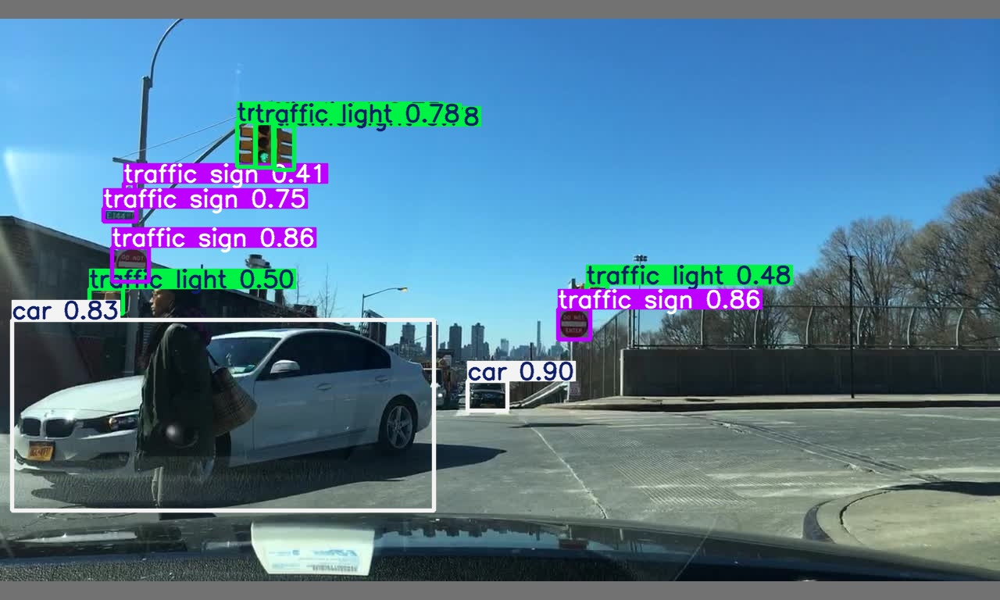

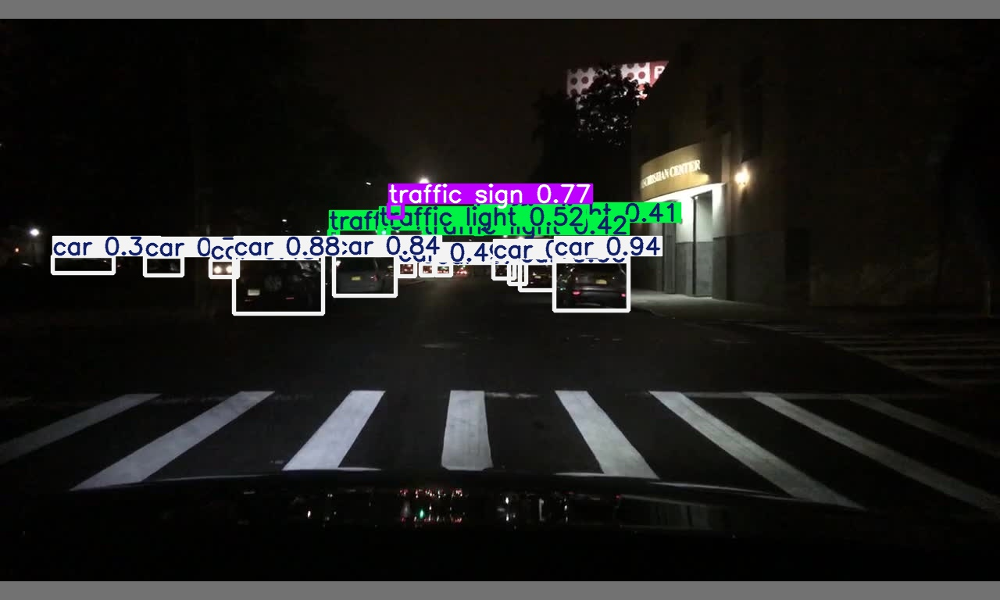

In [23]:
import glob
import cv2
from google.colab.patches import cv2_imshow

pred_imgs = glob.glob("/content/drive/MyDrive/traffic_project/runs10_long/yolov10_120ep2/*.jpg")[6:11]
for img in pred_imgs:
    img_bgr = cv2.imread(img)
    cv2_imshow(img_bgr)

### Compare YOLO models


 Evaluating YOLOv8s ...
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.0 ms, read: 94.4±43.2 MB/s, size: 183.7 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/val.cache... 877 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 877/877 1.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 5.5it/s 9.9s
                   all        877      15616      0.531      0.348      0.378      0.208
            pedestrian        282       1129      0.617      0.449      0.482       0.23
                 rider         47         60      0.692      0.283      0.342      0.178
                   car        862       8714      0.685      0.673      0.713      0.449
                 truck        215        301      0.476      0.382    

<Figure size 1000x600 with 0 Axes>

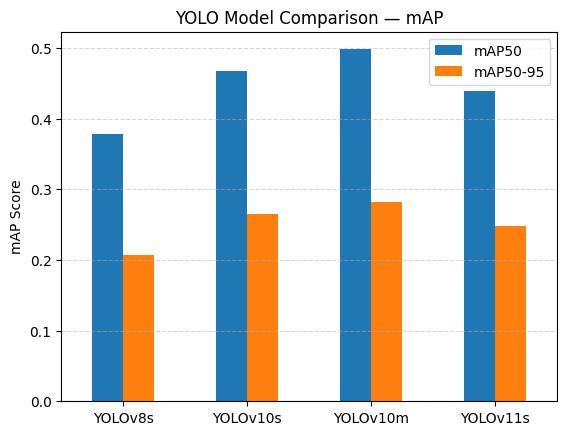

<Figure size 1000x600 with 0 Axes>

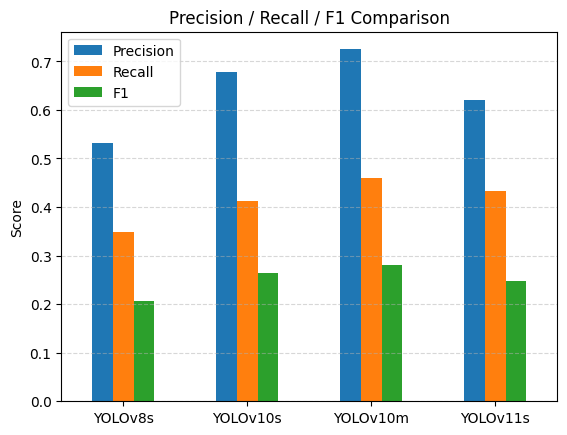

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ultralytics import YOLO

# Explicitly install ultralytics version 8.3.235 for compatibility
#!pip install ultralytics==8.3.235 --quiet

# ======================
#  UPDATE THESE PATHS
# ======================
model_paths = {
    "YOLOv8s": "/content/drive/MyDrive/traffic_project/runs/train_yolov82/weights/best.pt",
    "YOLOv10s": "/content/drive/MyDrive/traffic_project/runs10/train_yolov102/weights/best.pt",
    "YOLOv10m": "/content/drive/MyDrive/traffic_project/runs10_long/yolov10_120ep/weights/best.pt",
    "YOLOv11s": "/content/drive/MyDrive/traffic_project/runs11/train_yolo112/weights/best.pt"
}

data_yaml = "/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml"

# ======================
#  Evaluation + Metric Extraction
# ======================
metrics_dict = {}
per_class_maps = {}

for name, path in model_paths.items():
    print(f"\n Evaluating {name} ...")
    model = YOLO(path)

    # Use the 'val' split as defined in the data_yaml
    results = model.val(data=data_yaml, split="val")

    # Access metrics robustly as the structure can vary slightly by version
    metrics = results.results_dict  # returns clean metrics dict

    metrics_dict[name] = {
        "Precision": metrics.get("metrics/precision(B)", 0),
        "Recall": metrics.get("metrics/recall(B)", 0),
        "mAP50": metrics.get("metrics/mAP50(B)", 0),  # mAP50
        "mAP50-95": metrics.get("metrics/mAP50-95(B)", 0),  # mAP50-95
        "F1": metrics.get("fitness", 0)
    }

    # Save class-wise AP (list of APs per class index)
    # The 'ap_per_class' key is often a numpy array. Handle if it's missing or empty.
    if hasattr(results, 'ap_per_class') and results.ap_per_class is not None:
        # ap_per_class is usually a (num_classes, 1) array of mAP values
        per_class_maps[name] = results.ap_per_class[:, 0].tolist()
    else:
        per_class_maps[name] = [] # Fallback for models that might not provide it or older versions

# Convert results to DataFrame
metrics_df = pd.DataFrame(metrics_dict).T
metrics_df = metrics_df.round(4)
print("\n Model Performance Summary:\n")
print(metrics_df)

# ======================
#  Bar Chart Comparison
# ======================
plt.figure(figsize=(10,6))
metrics_df[['mAP50', 'mAP50-95']].plot(kind='bar')
plt.title("YOLO Model Comparison — mAP")
plt.ylabel("mAP Score")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

plt.figure(figsize=(10,6))
metrics_df[['Precision', 'Recall', 'F1']].plot(kind='bar')
plt.title("Precision / Recall / F1 Comparison")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


### Faster RCNN model

In [ ]:
import os
import torch
import numpy as np
import cv2
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Using device:", DEVICE)

Using device: cuda


In [ ]:
NUM_CLASSES = 10 + 1  # 10 classes + background
CLASS_NAMES = [
    'pedestrian','rider','car','truck','bus','train',
    'motorcycle','bicycle','traffic light','traffic sign'
]


In [ ]:
class BDDDataset(Dataset):
    def __init__(self, img_dir, label_dir):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.img_files = sorted(os.listdir(img_dir))

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        label_path = os.path.join(self.label_dir, img_name.replace('.jpg', '.txt'))

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        height, width, _ = img.shape

        boxes = []
        labels = []

        with open(label_path, "r") as f:
            for line in f.readlines():
                cls, x, y, w, h = map(float, line.split())
                # YOLO → Pascal VOC conversion
                xmin = (x - w/2) * width
                xmax = (x + w/2) * width
                ymin = (y - h/2) * height
                ymax = (y + h/2) * height
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(int(cls) + 1)  # +1 because class 0 = background in Faster R-CNN

        img = torch.tensor(img/255., dtype=torch.float32).permute(2, 0, 1)

        target = {
            'boxes': torch.tensor(boxes, dtype=torch.float32),
            'labels': torch.tensor(labels, dtype=torch.int64)
        }

        return img, target

In [ ]:
train_imgs = "/content/drive/MyDrive/traffic_project/yolo_dataset/images/train"
val_imgs = "/content/drive/MyDrive/traffic_project/yolo_dataset/images/val"

train_labels = "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/train"
val_labels = "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/val"

train_data = BDDDataset(train_imgs, train_labels)
val_data = BDDDataset(val_imgs, val_labels)

train_loader = DataLoader(train_data, batch_size=4, shuffle=True,
                          collate_fn=lambda x: tuple(zip(*x)))

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES)

model.to(DEVICE)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 200MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)

EPOCHS = 40

model.train()
for epoch in range(EPOCHS):
    total_loss = 0
    for imgs, targets in train_loader:
        imgs = [img.to(DEVICE) for img in imgs]
        targets = [{k: v.to(DEVICE) for k,v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)
        loss = sum(loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} - Loss: {total_loss:.4f}")
    torch.save(model.state_dict(), f"/content/drive/MyDrive/traffic_project/FasterRCNN_epoch_{epoch+1}.pth")

torch.save(model.state_dict(), "/content/drive/MyDrive/traffic_project/FasterRCNN_best.pth")
print("Training Completed & Model Saved")


Epoch 1/40 - Loss: 1985.4965
Epoch 2/40 - Loss: 1739.6579
Epoch 3/40 - Loss: 1661.1347
Epoch 4/40 - Loss: 1608.6246
Epoch 5/40 - Loss: 1571.8595
Epoch 6/40 - Loss: 1546.5692
Epoch 7/40 - Loss: 1536.9773
Epoch 8/40 - Loss: 1527.3673
Epoch 9/40 - Loss: 1524.3481
Epoch 10/40 - Loss: 1523.7026
Epoch 11/40 - Loss: 1536.1867
Epoch 12/40 - Loss: 1538.0594
Epoch 13/40 - Loss: 1538.7546
Epoch 14/40 - Loss: 1545.6340
Epoch 15/40 - Loss: 1555.4862
Epoch 16/40 - Loss: 1560.2967
Epoch 17/40 - Loss: 1569.9542
Epoch 18/40 - Loss: 1592.2653
Epoch 19/40 - Loss: 1595.2098
Epoch 20/40 - Loss: 1602.7187
Epoch 21/40 - Loss: 1603.3070
Epoch 22/40 - Loss: 1627.7981
Epoch 23/40 - Loss: 1602.4818
Epoch 24/40 - Loss: 1716.7115
Epoch 25/40 - Loss: 2012.5065
Epoch 26/40 - Loss: 1913.6461
Epoch 27/40 - Loss: 1754.8292
Epoch 28/40 - Loss: 1681.8509
Epoch 29/40 - Loss: 1647.5570
Epoch 30/40 - Loss: 1629.5423
Epoch 31/40 - Loss: 1615.5818
Epoch 32/40 - Loss: 1630.4632
Epoch 33/40 - Loss: 1596.2883
Epoch 34/40 - Loss:

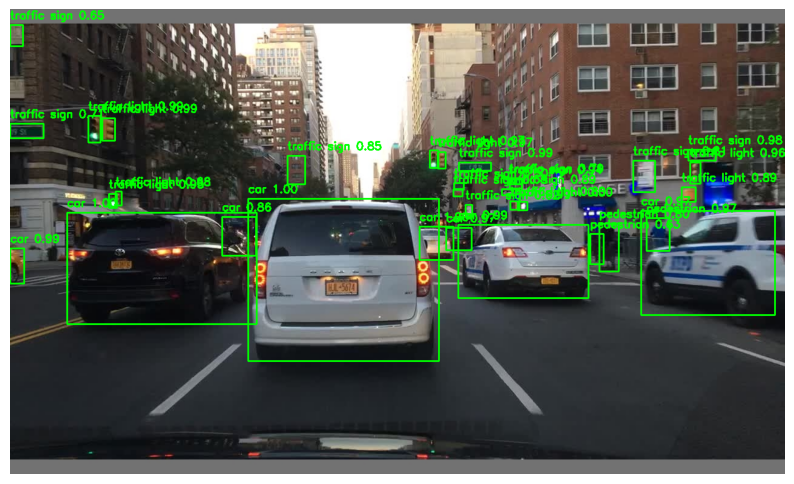

In [ ]:
import matplotlib.pyplot as plt
import random

model.eval()
idx = random.randint(0, len(val_data) - 1)
img, _ = val_data[idx]
img_tensor = img.to(DEVICE).unsqueeze(0)

with torch.no_grad():
    predictions = model(img_tensor)[0]

# Plot detections
plt.figure(figsize=(10,7))
img_show = img.permute(1,2,0).cpu().numpy().copy()

for box, label, score in zip(predictions['boxes'], predictions['labels'], predictions['scores']):
    if score > 0.5:
        x1, y1, x2, y2 = box.int().cpu().numpy()
        cls_name = CLASS_NAMES[label-1]
        cv2.rectangle(img_show, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.putText(img_show, f"{cls_name} {score:.2f}", (x1,y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

plt.imshow(img_show)
plt.axis('off')
plt.show()


### Compare all 4 models

In [6]:
pip install ultralytics torchvision torchmetrics tabulate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 36.2 MB/s eta 0:00:00


In [7]:
import torch
from ultralytics import YOLO
from tabulate import tabulate

# -----------------------------
# Model Paths
# -----------------------------
models = {
    "YOLOv8s": "/content/drive/MyDrive/traffic_project/runs/train_yolov82/weights/best.pt",
    "YOLOv10m": "/content/drive/MyDrive/traffic_project/runs10_long/yolov10_120ep/weights/best.pt",
    "YOLOv11s": "/content/drive/MyDrive/traffic_project/runs11/train_yolo112/weights/best.pt",
}

data_test_yaml = "/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml"

results_table = []

for name, model_path in models.items():
    print(f"\nEvaluating {name}...")

    model = YOLO(model_path)
    metrics = model.val(data=data_test_yaml, split='test')  # use your TEST split

    mAP50 = metrics.results_dict['metrics/mAP50(B)']
    mAP5095 = metrics.results_dict['metrics/mAP50-95(B)']
    precision = metrics.results_dict['metrics/precision(B)']
    recall = metrics.results_dict['metrics/recall(B)']
    f1 = 2*(precision*recall)/(precision+recall+1e-6)

    results_table.append([name, mAP50, mAP5095, precision, recall, f1])

# Print YOLO results
print("\nYOLO Evaluation Results:")
print(tabulate(results_table, headers=["Model", "mAP50", "mAP50-95", "Precision", "Recall", "F1"], floatfmt=".4f"))



Evaluating YOLOv8s...
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 0.6±0.1 MB/s, size: 269.7 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/test.cache... 878 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 878/878 967.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 1.1it/s 51.4s
                   all        878      15981      0.472       0.35      0.356      0.196
            pedestrian        277       1349      0.567      0.448       0.48      0.231
                 rider         57         67      0.498      0.254      0.263      0.128
                   car        861       8671      0.646      0.683      0.707      0.447
                 truck        235        368      0.531      0.448    

In [8]:
import os
import torch
from PIL import Image
from torch.utils.data import Dataset
import glob

class YOLOTestDataset(Dataset):
    def __init__(self, img_dir, label_dir, transform=None):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.img_files = sorted(glob.glob(os.path.join(img_dir, '*.jpg')) +
                                glob.glob(os.path.join(img_dir, '*.png')))

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_path = self.img_files[idx]
        label_path = os.path.join(
            self.label_dir,
            os.path.basename(img_path).replace('.jpg', '.txt').replace('.png', '.txt')
        )

        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        boxes = []
        labels = []

        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f.read().strip().split("\n"):
                    c, xc, yc, bw, bh = map(float, line.split())
                    c = int(c)

                    x_min = (xc - bw/2) * w
                    y_min = (yc - bh/2) * h
                    x_max = (xc + bw/2) * w
                    y_max = (yc + bh/2) * h

                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(c + 1)  # shift classes for FasterRCNN

        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64)
        }

        if self.transform:
            img = self.transform(img)

        return img, target

In [9]:
def __getitem__(self, idx):
    img_path = self.imgs[idx]
    img = Image.open(img_path).convert("RGB")

    # Find matching YOLO label (.txt)
    label_path = os.path.join(
        self.labels_dir, os.path.splitext(os.path.basename(img_path))[0] + ".txt"
    )

    boxes = []
    labels = []

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                c, x_center, y_center, w, h = map(float, line.strip().split())

                # Convert YOLO coords -> absolute pixel coords
                x1 = (x_center - w / 2) * img.width
                y1 = (y_center - h / 2) * img.height
                x2 = (x_center + w / 2) * img.width
                y2 = (y_center + h / 2) * img.height

                boxes.append([x1, y1, x2, y2])
                labels.append(int(c + 1))  # +1 ✅ reserve 0 = background

    # ✅ Convert to tensor (even if empty)
    boxes = torch.tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0, 4), dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.int64) if labels else torch.zeros((0,), dtype=torch.int64)

    target = {
        "boxes": boxes,
        "labels": labels,
        "image_id": torch.tensor([idx]),
    }

    if self.transform:
        img = self.transform(img)

    return img, target


In [10]:
import os
import cv2
import torch
from torch.utils.data import Dataset
from torchvision.ops import box_convert

class YOLOBDD100KDataset(Dataset):
    def __init__(self, img_dir, label_dir, transforms=None):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transforms = transforms

        self.image_files = sorted([
            f for f in os.listdir(img_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))
        ])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Load label file
        label_path = os.path.join(
            self.label_dir, img_name.replace(".jpg", ".txt").replace(".png", ".txt")
        )

        boxes = []
        labels = []

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f.readlines():
                    cls, cx, cy, bw, bh = map(float, line.split())
                    cls = int(cls)

                    # Convert YOLO -> pixel coords
                    x1 = (cx - bw/2) * w
                    y1 = (cy - bh/2) * h
                    x2 = (cx + bw/2) * w
                    y2 = (cy + bh/2) * h

                    boxes.append([x1, y1, x2, y2])
                    labels.append(cls + 1)  # shift +1 to reserve 0 for background ✅

        # Convert to tensors
        if len(boxes) == 0:
            boxes = torch.zeros((0,4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx]),
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target


In [11]:
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn
import torchvision.transforms as T
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import os
from PIL import Image

import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
num_classes = 11
model = fasterrcnn_resnet50_fpn(num_classes=num_classes)
model.load_state_dict(torch.load("/content/drive/MyDrive/traffic_project/FasterRCNN_best.pth"))
model.to(device).eval()

transform = T.Compose([T.ToTensor()])

test_images_dir = "/content/drive/MyDrive/traffic_project/yolo_dataset/images/test"
test_labels_dir = "/content/drive/MyDrive/traffic_project/yolo_dataset/labels/test"

metric = MeanAveragePrecision(box_format='xyxy', class_metrics=False) # class_metrics=False for simpler case, can be true

print("\nEvaluating Faster R-CNN...")

for img_name in os.listdir(test_images_dir):
    img_path = os.path.join(test_images_dir, img_name)
    lbl_path = os.path.join(test_labels_dir, img_name.replace('.jpg', '.txt').replace('.png', '.txt'))

    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).to(device)

    with torch.no_grad():
        pred = model([img_tensor])[0]

    # Convert GT from YOLO txt → xyxy
    h, w = img.size[1], img.size[0]
    targets = {"boxes": [], "labels": []}

    # Check if label file exists and is not empty
    if os.path.exists(lbl_path) and os.path.getsize(lbl_path) > 0:
        with open(lbl_path) as f:
            for line in f.readlines():
                # Ensure line is not empty
                if not line.strip():
                    continue
                parts = line.split()
                # Ensure there are enough parts to unpack
                if len(parts) < 5:
                    continue
                try:
                    cls, xc, yc, bw, bh = map(float, parts)
                    x1 = (xc - bw/2) * w
                    y1 = (yc - bh/2) * h
                    x2 = (xc + bw/2) * w
                    y2 = (yc + bh/2) * h
                    targets["boxes"].append([x1, y1, x2, y2])
                    targets["labels"].append(int(cls+1))  # class shift if background=0
                except ValueError as e:
                    print(f"Skipping malformed line in {lbl_path}: {line.strip()} - {e}")

    # Ensure targets are tensors, even if empty, and move them to the correct device
    targets["boxes"] = torch.tensor(targets["boxes"], dtype=torch.float32).to(device) if targets["boxes"] else torch.zeros((0, 4), dtype=torch.float32).to(device)
    targets["labels"] = torch.tensor(targets["labels"], dtype=torch.int64).to(device) if targets["labels"] else torch.zeros((0,), dtype=torch.int64).to(device)

    metric.update([pred], [targets])

faster_metrics = metric.compute()
print(faster_metrics)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 223MB/s]



Evaluating Faster R-CNN...
{'map': tensor(0.1583), 'map_50': tensor(0.3536), 'map_75': tensor(0.1216), 'map_small': tensor(0.0946), 'map_medium': tensor(0.2041), 'map_large': tensor(0.2376), 'mar_1': tensor(0.1326), 'mar_10': tensor(0.2675), 'mar_100': tensor(0.2873), 'mar_small': tensor(0.1947), 'mar_medium': tensor(0.3350), 'mar_large': tensor(0.3597), 'map_per_class': tensor(-1.), 'mar_100_per_class': tensor(-1.), 'classes': tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=torch.int32)}


In [13]:
# Requirements
!pip install ultralytics pycocotools torchvision==0.15.2 torch --quiet

import os
import json
from pathlib import Path
from tqdm import tqdm
import torch
import pandas as pd
import numpy as np
import yaml

# User paths
yolo_models = {
    "YOLOv8s": "/content/drive/MyDrive/traffic_project/runs/train_yolov82/weights/best.pt",
    "YOLOv10m": "/content/drive/MyDrive/traffic_project/runs10_long/yolov10_120ep/weights/best.pt",
    "YOLOv11s": "/content/drive/MyDrive/traffic_project/runs11/train_yolo112/weights/best.pt",
}
fasterrcnn_path = "/content/drive/MyDrive/traffic_project/FasterRCNN_best.pth"
data_test_yaml = "/content/drive/MyDrive/traffic_project/yolo_dataset/data.yaml"
test_img_dir = Path("/content/drive/MyDrive/traffic_project/yolo_dataset/images/test")
test_lbl_dir = Path("/content/drive/MyDrive/traffic_project/yolo_dataset/labels/test")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------------------
# Read data.yaml to get class names and nc
# ---------------------------
with open(data_test_yaml, 'r') as f:
    data_cfg = yaml.safe_load(f)
class_names = data_cfg.get("names") or data_cfg.get("labels") or {}
if isinstance(class_names, dict):
    names = [class_names[i] for i in sorted(class_names.keys(), key=int)]
else:
    names = class_names
num_classes = len(names)
print(f"Found {num_classes} classes.")

# ---------------------------
# Helper: safe F1
# ---------------------------
def safe_f1(p, r):
    if p + r == 0:
        return 0.0
    return 2 * p * r / (p + r)

results = []

# ---------------------------
# Evaluate YOLO models using ultralytics
# ---------------------------
from ultralytics import YOLO
for name, path in yolo_models.items():
    print(f"\n=== Evaluating {name} ===")
    model = YOLO(path)
    # run val; returns a Metric object or list-like; use returned object
    metrics = model.val(data=data_test_yaml, device=str(device), split='test')

    # ultralytics might return list or object; try to access common attributes robustly
    # most stable: metrics.box.map (AP 50:95), metrics.box.map50, metrics.box.p (precision), metrics.box.r (recall)
    box = getattr(metrics, "box", None)
    if box is None:
        # older APIs returned metrics[0]
        if isinstance(metrics, (list, tuple)) and len(metrics) > 0:
            box = getattr(metrics[0], "box", None)
    if box is None:
        raise RuntimeError("Could not find box metrics in YOLO val output. Inspect 'metrics' object.")

    mp = float(getattr(box, "mp", None) or getattr(box, "p", None) or 0.0)   # precision
    mr = float(getattr(box, "mr", None) or getattr(box, "r", None) or 0.0)   # recall
    map50 = float(getattr(box, "map50", None) or 0.0)
    map50_95 = float(getattr(box, "map", None) or 0.0)

    mf1 = safe_f1(mp, mr)

    results.append({
        "Model": name,
        "mAP50": map50,
        "mAP50-95": map50_95,
        "Precision": mp,
        "Recall": mr,
        "F1 Score": mf1
    })
    # save predictions in COCO-like JSON for later comparison if needed
    # ultralytics .predict/save might write outputs; skipping here to rely on its val metrics

# ---------------------------
# Faster-RCNN: build COCO-style GT and predictions, then run pycocotools COCOeval
# ---------------------------
print("\n=== Evaluating Faster-RCNN with COCO mAP ===")
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision import transforms
import cv2
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import tempfile

# Load Faster-RCNN (adjust num_classes to include background)
faster_rcnn = fasterrcnn_resnet50_fpn(num_classes=num_classes + 1)  # background + classes
faster_rcnn.load_state_dict(torch.load(fasterrcnn_path, map_location=device))
faster_rcnn.to(device)
faster_rcnn.eval()

transform = transforms.Compose([transforms.ToTensor()])

# Prepare COCO-style GT (annotations) and image list
coco_gt = {
    "info": {
        "description": "Traffic Scene COCO Dataset",
        "version": "1.0",
        "contributor": "User",
        "date_created": "2025-10-29"
    },
    "licenses": [
        {"id": 1, "name": "Unknown", "url": "https://example.com"}
    ],
    "images": [],
    "annotations": [],
    "categories": []
}

# categories
for i, cname in enumerate(names, start=1):  # COCO category ids start at 1
    coco_gt["categories"].append({"id": i, "name": cname})

annotation_id = 1
image_id = 1
img_file_list = sorted([p for p in os.listdir(test_img_dir) if p.lower().endswith(('.jpg', '.jpeg', '.png'))])

# iterate and build GT & run inference to collect predictions
predictions_coco = []  # list of dicts for COCO detections
for img_fname in tqdm(img_file_list, desc="Processing images"):
    img_path = test_img_dir / img_fname
    img = cv2.imread(str(img_path))
    if img is None:
        print("Warning: couldn't read", img_path)
        continue
    h, w = img.shape[:2]

    # add image entry
    coco_gt["images"].append({"file_name": img_fname, "height": h, "width": w, "id": image_id})

    # read YOLO-format GT label file(s): class x_center y_center width height (normalized)
    lbl_path = test_lbl_dir / (Path(img_fname).stem + ".txt")
    if lbl_path.exists():
        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                cls = int(parts[0])
                x_c, y_c, bw, bh = map(float, parts[1:5])
                # convert normalized xywh to absolute x,y,w,h (COCO uses top-left x,y)
                abs_w = bw * w
                abs_h = bh * h
                abs_x = x_c * w - abs_w / 2
                abs_y = y_c * h - abs_h / 2
                # COCO annotation
                coco_gt["annotations"].append({
                    "id": annotation_id,
                    "image_id": image_id,
                    "category_id": cls + 1,  # shift because YOLO classes 0..N-1 -> COCO 1..N
                    "bbox": [abs_x, abs_y, abs_w, abs_h],
                    "area": abs_w * abs_h,
                    "iscrowd": 0
                })
                annotation_id += 1

    # run model inference
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    tensor = transform(img_rgb).to(device)
    with torch.no_grad():
        out = faster_rcnn([tensor])[0]

    boxes = out['boxes'].detach().cpu().numpy()
    scores = out['scores'].detach().cpu().numpy()
    labels = out['labels'].detach().cpu().numpy()

    # threshold predictions (choose 0.05 to pass more to COCOeval; COCOeval filters by IoU)
    keep = scores > 0.05
    for bb, sc, lb in zip(boxes[keep], scores[keep], labels[keep]):
        # bb: [x1, y1, x2, y2], convert to x,y,w,h
        x1, y1, x2, y2 = map(float, bb)
        bw = max(0.0, x2 - x1)
        bh = max(0.0, y2 - y1)
        predictions_coco.append({
            "image_id": image_id,
            "category_id": int(lb),           # torchvision labels likely 1..num_classes
            "bbox": [x1, y1, bw, bh],
            "score": float(sc)
        })

    image_id += 1

# Save temporary COCO GT and predictions to files for pycocotools
tmp_dir = tempfile.mkdtemp()
gt_json_path = os.path.join(tmp_dir, "coco_gt.json")
preds_json_path = os.path.join(tmp_dir, "fasterrcnn_preds.json")

with open(gt_json_path, 'w') as f:
    json.dump(coco_gt, f)

with open(preds_json_path, 'w') as f:
    json.dump(predictions_coco, f)

# Run COCO evaluation
cocoGt = COCO(gt_json_path)
cocoDt = cocoGt.loadRes(preds_json_path)
cocoEval = COCOeval(cocoGt, cocoDt, iouType='bbox')
cocoEval.params.imgIds = [img['id'] for img in coco_gt['images']]
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# cocoEval.stats has standard table:
# stats[0] = AP (IoU=0.50:0.95)  -> mAP50-95
# stats[1] = AP50 (IoU=0.50)     -> mAP50
# stats[2] = AP75
# stats[8] = AR (maxDets=100)
map50_95 = float(cocoEval.stats[0])
map50 = float(cocoEval.stats[1])


ERROR: Ignored the following yanked versions: 0.1.6, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 0.2.1, 0.2.2, 0.2.2.post2, 0.2.2.post3
ERROR: Could not find a version that satisfies the requirement torchvision==0.15.2 (from versions: 0.17.0, 0.17.1, 0.17.2, 0.18.0, 0.18.1, 0.19.0, 0.19.1, 0.20.0, 0.20.1, 0.21.0, 0.22.0, 0.22.1, 0.23.0, 0.24.0, 0.24.1)
ERROR: No matching distribution found for torchvision==0.15.2
Found 10 classes.

=== Evaluating YOLOv8s ===
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 86.1±42.0 MB/s, size: 154.9 KB)
val: Scanning /content/drive/MyDrive/traffic_project/yolo_dataset/labels/test.cache... 878 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 878/878 1.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 5.1it/s 10.8s
  

Processing images: 100%|██████████| 878/878 [00:44<00:00, 19.61it/s]


loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.66s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=10.28s).
Accumulating evaluation results...
DONE (t=0.98s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.158
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.354
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.122
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.238
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.133
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.267
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

#### Yolov10 performed better than other models, it is selected as backbone object detection model.
#### In vlm.ipynb, yolov10m trained weights is loaded to connect with fusion layer.